In [1]:
import numpy as np 
import pandas as pd 

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

from torch.utils.data import DataLoader
import torchvision.transforms as T
from torchvision.datasets import OxfordIIITPet
from tqdm import tqdm
import torch
import matplotlib.pyplot as plt
from IPython.display import clear_output
import torch.nn as nn
from torch.optim import Adam
from torchvision.models import alexnet
from torchvision.models import resnet18
from PIL import Image
from typing import Tuple, List

# 1.Downloading

In [2]:
dataset = OxfordIIITPet('pets', download=True)

100%|██████████| 791918971/791918971 [00:22<00:00, 35012240.22it/s]


Extracting pets/oxford-iiit-pet/images.tar.gz to pets/oxford-iiit-pet


100%|██████████| 19173078/19173078 [00:01<00:00, 14322166.30it/s]


Extracting pets/oxford-iiit-pet/annotations.tar.gz to pets/oxford-iiit-pet


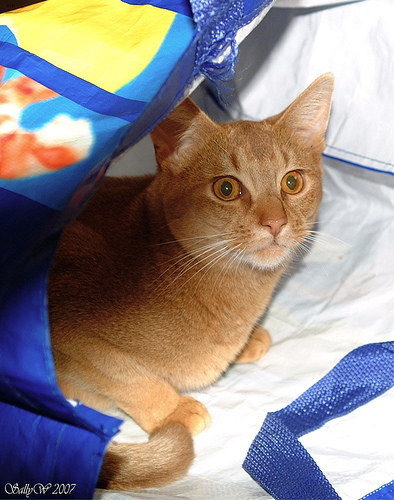

In [3]:
dataset[0][0]

In [4]:
len(dataset)

3680

Let's see what classes are present in the dataset

In [5]:
dataset.classes

['Abyssinian',
 'American Bulldog',
 'American Pit Bull Terrier',
 'Basset Hound',
 'Beagle',
 'Bengal',
 'Birman',
 'Bombay',
 'Boxer',
 'British Shorthair',
 'Chihuahua',
 'Egyptian Mau',
 'English Cocker Spaniel',
 'English Setter',
 'German Shorthaired',
 'Great Pyrenees',
 'Havanese',
 'Japanese Chin',
 'Keeshond',
 'Leonberger',
 'Maine Coon',
 'Miniature Pinscher',
 'Newfoundland',
 'Persian',
 'Pomeranian',
 'Pug',
 'Ragdoll',
 'Russian Blue',
 'Saint Bernard',
 'Samoyed',
 'Scottish Terrier',
 'Shiba Inu',
 'Siamese',
 'Sphynx',
 'Staffordshire Bull Terrier',
 'Wheaten Terrier',
 'Yorkshire Terrier']

In [6]:
num_classes = len(dataset.classes)

num_classes

37

Convert all images to the same size and normalize

In [7]:
transform = T.Compose(
    [
        T.Resize((224, 224)),
        T.ToTensor(),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ]
)

train_dataset = OxfordIIITPet('pets', transform=transform)
valid_dataset = OxfordIIITPet('pets', transform=transform, split='test')

In [8]:
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True, num_workers=8, pin_memory=True)
valid_loader = DataLoader(valid_dataset, batch_size=128, shuffle=False, num_workers=8, pin_memory=True)

/opt/conda/lib/python3.10/site-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


# 2.Let's define all the main functions for training

In [9]:
def train(model) -> float:
    model.train()

    train_loss = 0
    total = 0
    correct = 0

    for x, y in tqdm(train_loader, desc='Train'):
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        output = model(x)
        loss = loss_fn(output, y)
        train_loss += loss.item()
        loss.backward()
        optimizer.step()
        
        _, y_pred = torch.max(output, 1)
        total += y.size(0)
        correct += (y_pred == y).sum().item()

    train_loss /= len(train_loader)
    accuracy = correct / total

    return train_loss, accuracy

In [10]:
@torch.inference_mode()
def evaluate(model, loader) -> tuple[float, float]:
    model.eval()

    total_loss = 0
    total = 0
    correct = 0

    for x, y in tqdm(loader, desc='Evaluation'):
        x, y = x.to(device), y.to(device)
        output = model(x)
        loss = loss_fn(output, y)
        total_loss += loss.item()

        _, y_pred = torch.max(output, 1)
        total += y.size(0)
        correct += (y_pred == y).sum().item()

    total_loss /= len(loader)
    accuracy = correct / total

    return total_loss, accuracy

In [11]:
def plot_stats(
    train_loss: list[float],
    valid_loss: list[float],
    train_accuracy: list[float],
    valid_accuracy: list[float],
    title: str
):
    plt.figure(figsize=(16, 8))

    plt.title(title + ' loss')

    plt.plot(train_loss, label='Train loss')
    plt.plot(valid_loss, label='Valid loss')
    plt.legend()
    plt.grid()

    plt.show()

    plt.figure(figsize=(16, 8))

    plt.title(title + ' accuracy')
    
    plt.plot(train_accuracy, label='Train accuracy')
    plt.plot(valid_accuracy, label='Valid accuracy')
    plt.legend()
    plt.grid()

    plt.show()

In [12]:
def whole_train_valid_cycle(model, num_epochs, title):
    train_loss_history, valid_loss_history = [], []
    train_accuracy_history, valid_accuracy_history = [], []

    for epoch in range(num_epochs):
        train_loss, train_accuracy = train(model)
        valid_loss, valid_accuracy = evaluate(model, valid_loader)

        train_loss_history.append(train_loss)
        valid_loss_history.append(valid_loss)

        train_accuracy_history.append(train_accuracy)
        valid_accuracy_history.append(valid_accuracy)

        clear_output()

        plot_stats(
            train_loss_history, valid_loss_history,
            train_accuracy_history, valid_accuracy_history,
            title
        )

In [13]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

print(device)
print(torch.cuda.get_device_name())

loss_fn = nn.CrossEntropyLoss()

cuda:0
Tesla T4


# 3. AlexNet

In [14]:
model = alexnet(pretrained=True)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:00<00:00, 253MB/s] 


In [15]:
model

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [16]:
model.classifier[6] = nn.Linear(in_features=4096, out_features=num_classes) #replace the number of output classes
model

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

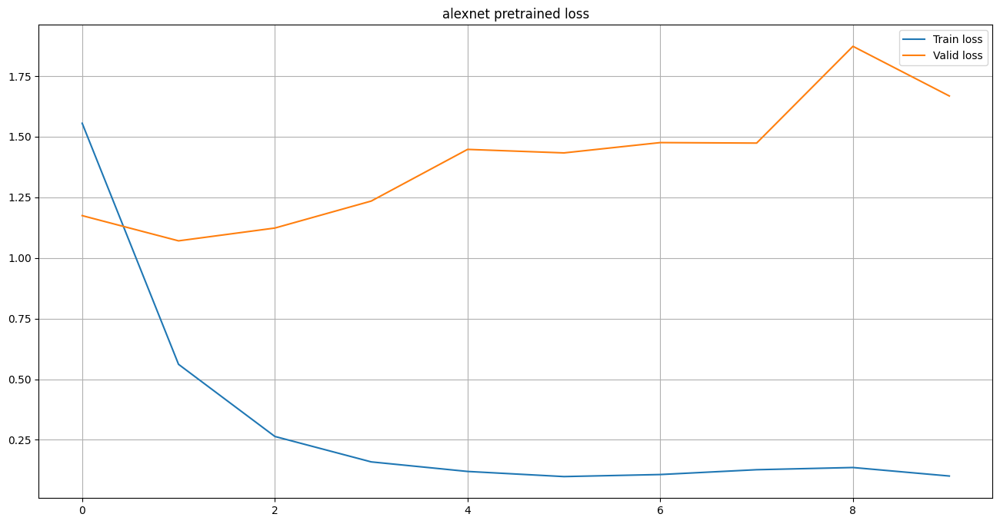

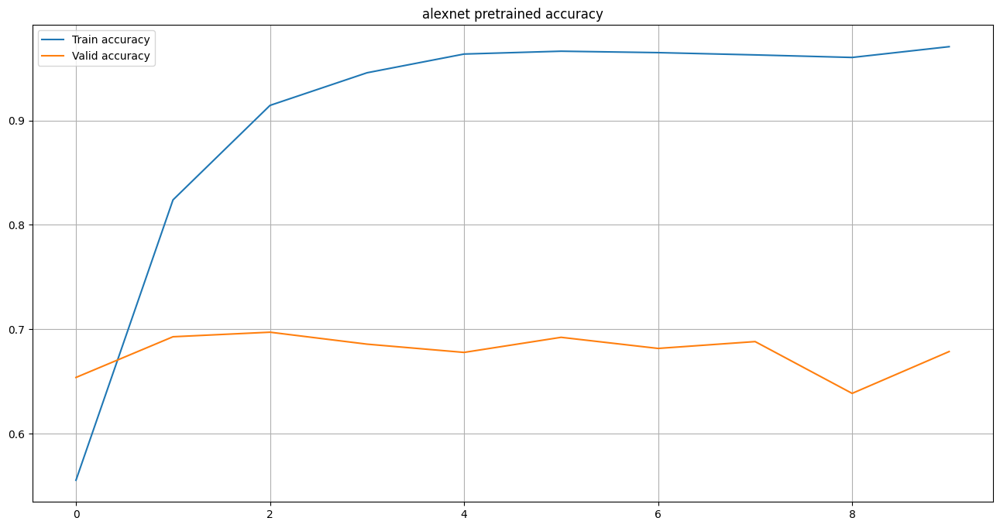

In [17]:
model = model.to(device)

model.features.requires_grad_(False) #turn off gradient calculation for "features"
model.features[8].requires_grad_(True) #turn on gradient calculation for layer 8 for "features"
model.features[10].requires_grad_(True) #turn on gradient calculation for layer 10 for "features"

optimizer = Adam(
    [
        {'params': model.classifier.parameters(), 'lr': 1e-3},
        {'params': model.features[10].parameters(), 'lr': 2e-4},
        {'params': model.features[8].parameters(), 'lr': 1e-4}
    ]
)

whole_train_valid_cycle(model, 10, 'alexnet pretrained')

We use the same architecture "AlexNet" but not pre-trained

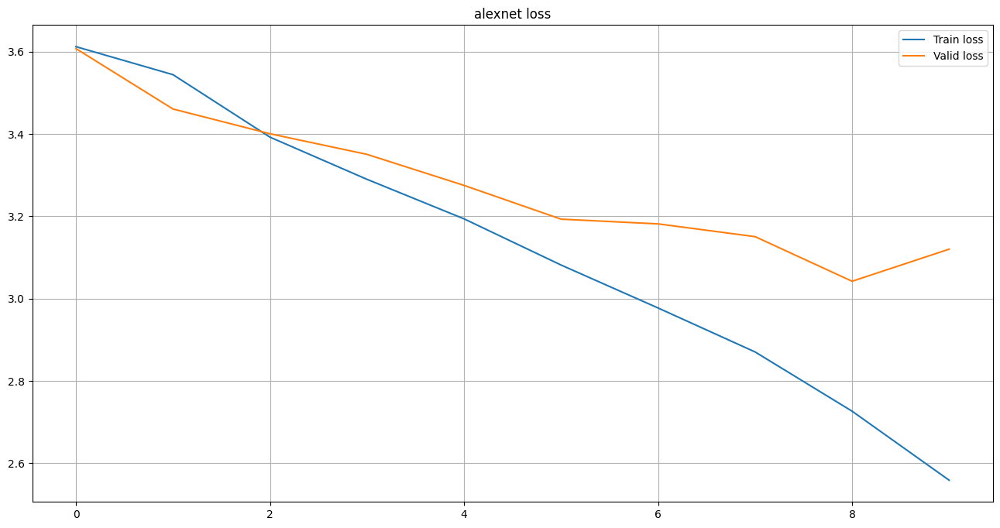

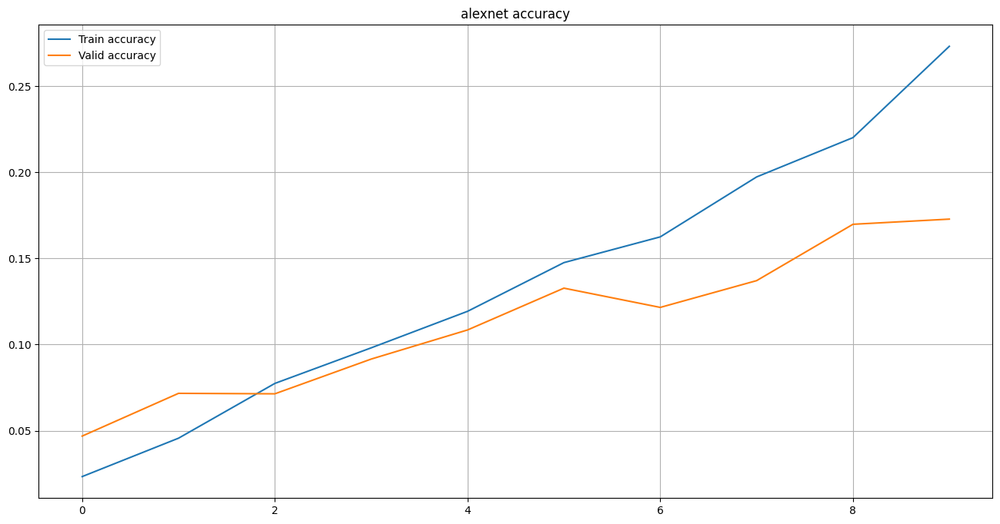

In [18]:
model = alexnet(pretrained=False)
model.classifier[6] = nn.Linear(in_features=4096, out_features=num_classes) #replace the number of output classes
model = model.to(device)
optimizer = Adam(model.parameters(), lr=1e-4)

whole_train_valid_cycle(model, 10, 'alexnet')

# 4. ResNet18

In [19]:
model = resnet18(pretrained=True)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 205MB/s] 


In [20]:
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [21]:
model.fc = nn.Linear(in_features=512, out_features=num_classes) #replace the number of output classes
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

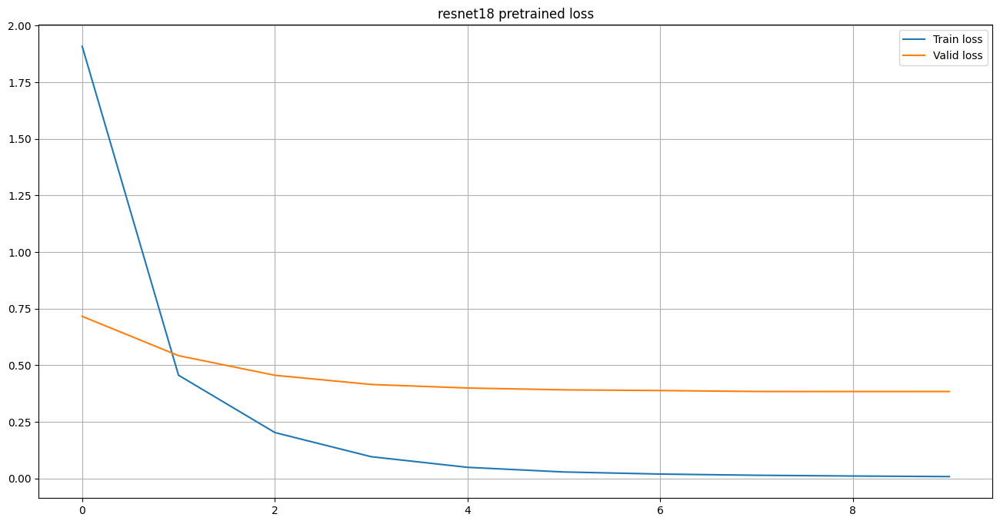

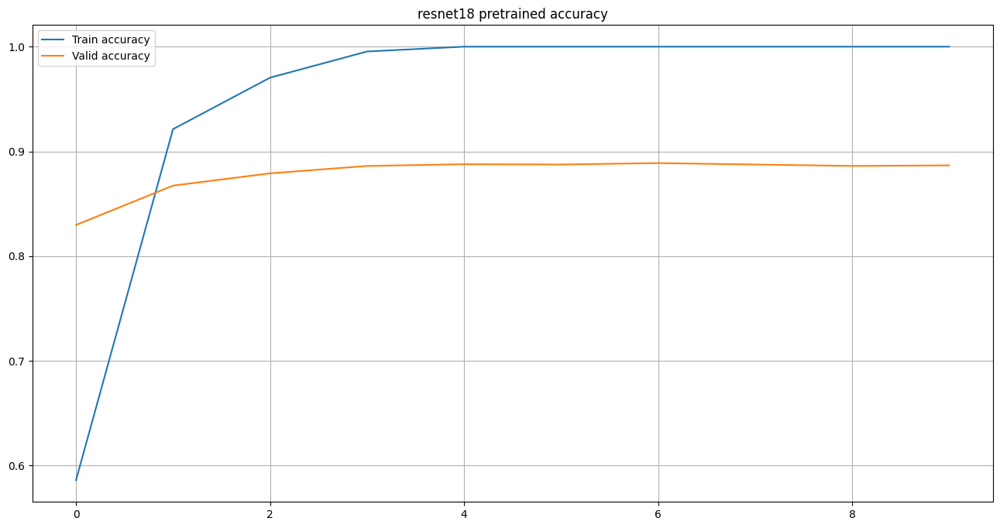

In [22]:
model = model.to(device)

model.requires_grad_(False) #turn off gradient calculation 
model.layer4.requires_grad_(True) 
model.fc.requires_grad_(True) #enable for the last fully connected

optimizer = Adam(
    [
        {'params': model.fc.parameters(), 'lr': 1e-3},
        {'params': model.layer4.parameters(), 'lr': 1e-4}
    ]
)

whole_train_valid_cycle(model, 10, 'resnet18 pretrained')

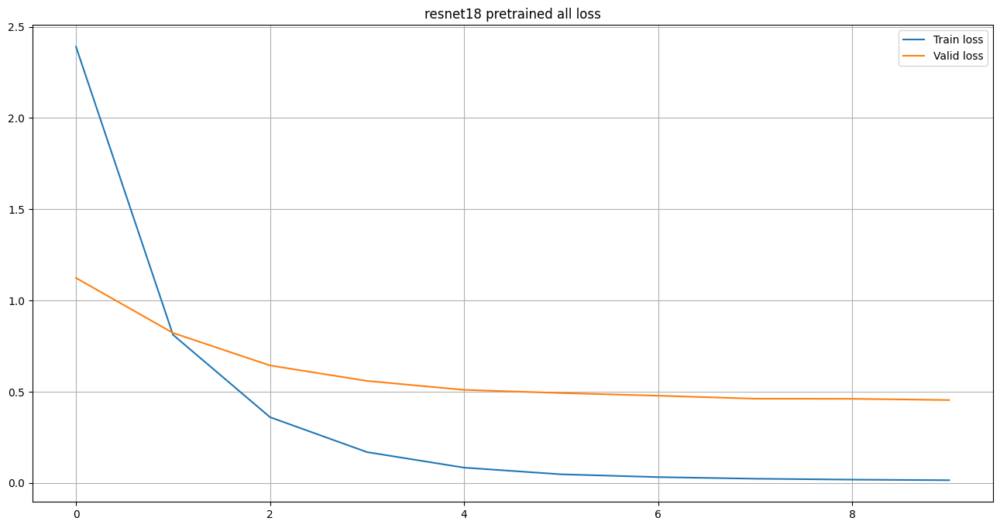

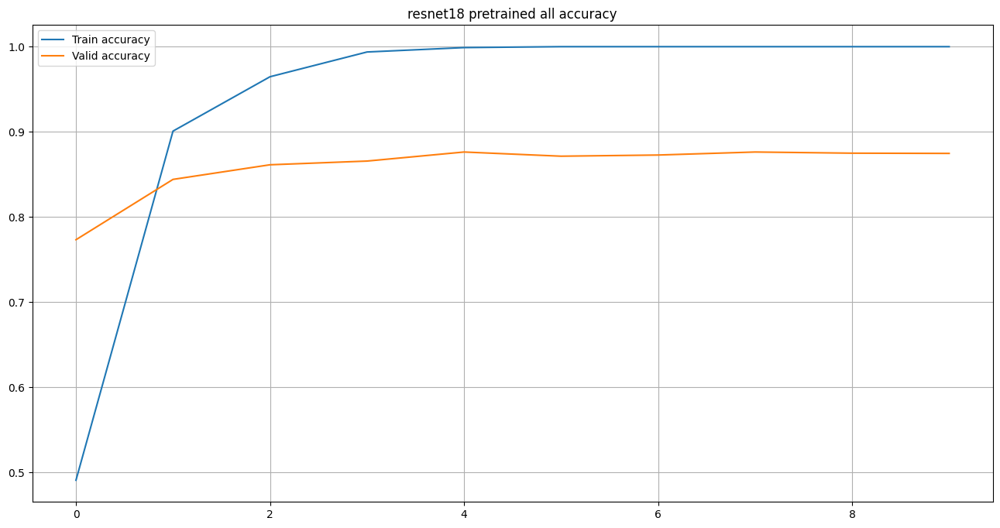

In [23]:
model = resnet18(pretrained=True)
model.fc = nn.Linear(in_features=512, out_features=num_classes)
model = model.to(device)
optimizer = Adam(model.parameters(), lr=1e-4)

whole_train_valid_cycle(model, 10, 'resnet18 pretrained all')

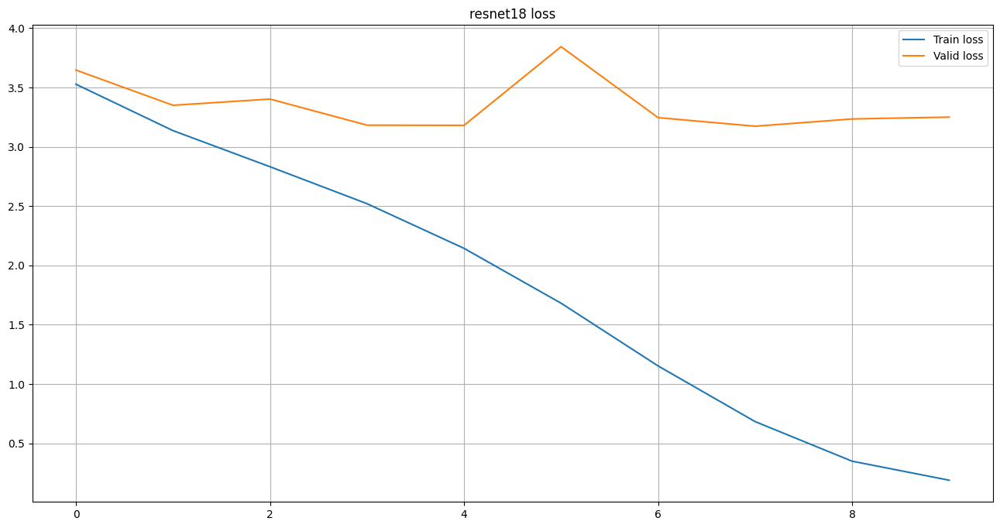

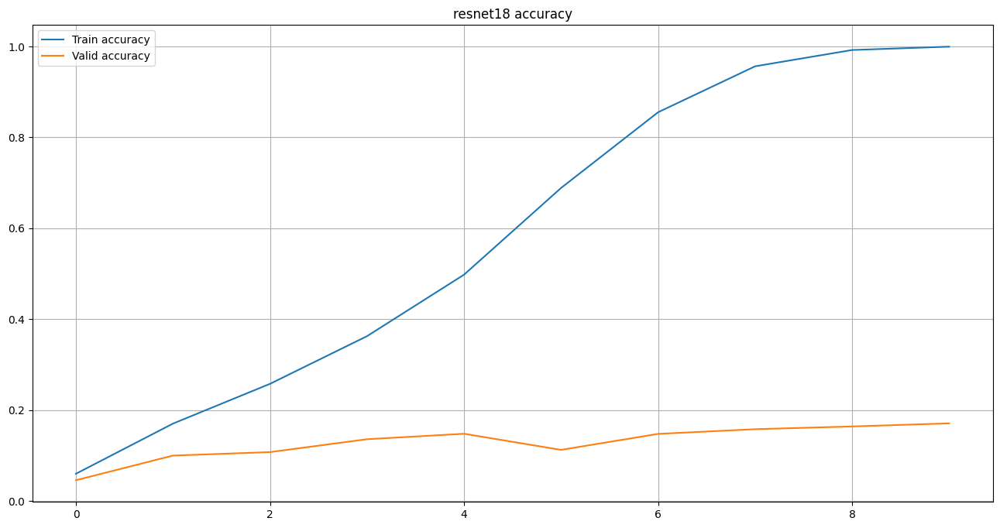

In [24]:
model = resnet18(pretrained=False)
model.fc = nn.Linear(in_features=512, out_features=num_classes)
model = model.to(device)
optimizer = Adam(model.parameters(), lr=1e-4)

whole_train_valid_cycle(model, 10, 'resnet18')

A function that takes as arguments the name of the architecture, the number of classes for the classification task, and whether it is worth initializing the model using those obtained during training on the ImageNet dataset

In [25]:
def get_pretrained_model(model_name: str, num_classes: int, pretrained: bool = True):
    if model_name == "resnet18":
        model = resnet18(pretrained=pretrained)

        model.fc = nn.Linear(512, num_classes)

    elif model_name == "vgg11":
        model = vgg11(pretrained=pretrained)

        model.classifier[6] = nn.Linear(4096, num_classes)

    elif model_name == "googlenet":
        model = googlenet(pretrained=pretrained)

        model.aux1.fc2 = nn.Linear(1024, num_classes)
        model.aux2.fc2 = nn.Linear(1024, num_classes)
        model.fc = nn.Linear(1024, num_classes)

    elif model_name == "alexnet":
        model = alexnet(pretrained=pretrained)

        model.classifier[6] = nn.Linear(4096, num_classes)
    else:
        raise ValueError(f"{model_name=} not supported")

    return model

# 5.Segmentation UNET

In [26]:
dataset = OxfordIIITPet('OxfordIIITPet', download=True, target_types='segmentation')

100%|██████████| 791918971/791918971 [00:22<00:00, 35872930.67it/s]


Extracting OxfordIIITPet/oxford-iiit-pet/images.tar.gz to OxfordIIITPet/oxford-iiit-pet


100%|██████████| 19173078/19173078 [00:01<00:00, 15566230.99it/s]


Extracting OxfordIIITPet/oxford-iiit-pet/annotations.tar.gz to OxfordIIITPet/oxford-iiit-pet


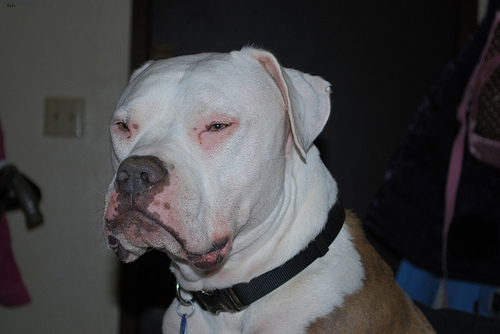

In [27]:
dataset[60][0]

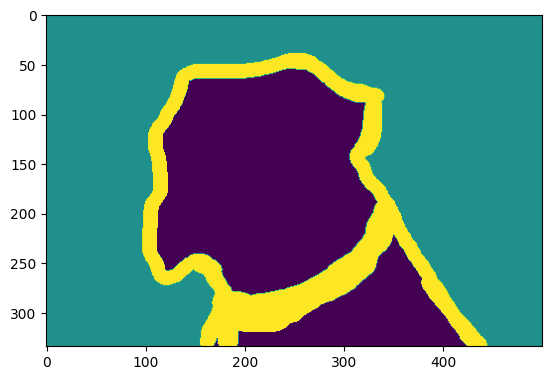

In [28]:
plt.imshow(dataset[60][1])

In [29]:
transform = T.Compose(
    [
        T.Resize((256, 256)), #size
        T.ToTensor(),
    ]
)

target_transform = T.Compose(
    [
        T.Resize((256, 256)), #size
        T.PILToTensor(),
        T.Lambda(lambda x: (x - 1).long())
    ]
)

train_dataset = OxfordIIITPet('OxfordIIITPet', 
                              transform=transform, 
                              target_transform=target_transform, 
                              target_types='segmentation')
valid_dataset = OxfordIIITPet('OxfordIIITPet', 
                              transform=transform, 
                              split='test', 
                              target_transform=target_transform, 
                              target_types='segmentation')

In [30]:
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=8, pin_memory=True)
valid_loader = DataLoader(valid_dataset, batch_size=64, shuffle=True, num_workers=8, pin_memory=True)

In [31]:
def train(model) -> float:
    model.train()

    train_loss = 0
    total = 0
    correct = 0

    for x, y in tqdm(train_loader, desc='Train'):
        bs = y.size(0)
        x, y = x.to(device), y.squeeze(1).to(device)
        optimizer.zero_grad()
        output = model(x) #forward pass
        loss = loss_fn(output.reshape(bs, 3, -1), y.reshape(bs, -1)) #draw it into a vector to calculate loss
        train_loss += loss.item()
        loss.backward()
        optimizer.step()

        _, y_pred = output.max(dim=1)
        total += y.size(0) * y.size(1) * y.size(2)
        correct += (y == y_pred).sum().item()

    train_loss /= len(train_loader)
    accuracy = correct / total

    return train_loss, accuracy

In [32]:
@torch.inference_mode()
def evaluate(model, loader) -> Tuple[float, float]:
    model.eval()

    total_loss = 0
    total = 0
    correct = 0

    for x, y in tqdm(loader, desc='Evaluation'):
        bs = y.size(0)
        x, y = x.to(device), y.squeeze(1).to(device)
        output = model(x)
        loss = loss_fn(output.reshape(bs, 3, -1), y.reshape(bs, -1))
        total_loss += loss.item()

        _, y_pred = output.max(dim=1)
        total += y.size(0) * y.size(1) * y.size(2)
        correct += (y == y_pred).sum().item()

    total_loss /= len(loader)
    accuracy = correct / total

    return total_loss, accuracy

In [33]:
def plot_stats(
    train_loss: List[float],
    valid_loss: List[float],
    train_accuracy: List[float],
    valid_accuracy: List[float],
    title: str
):
    plt.figure(figsize=(16, 8))

    plt.title(title + ' loss')

    plt.plot(train_loss, label='Train loss')
    plt.plot(valid_loss, label='Valid loss')
    plt.legend()
    plt.grid()

    plt.show()

    plt.figure(figsize=(16, 8))

    plt.title(title + ' accuracy')
    
    plt.plot(train_accuracy, label='Train accuracy')
    plt.plot(valid_accuracy, label='Valid accuracy')
    plt.legend()
    plt.grid()

    plt.show()

In [34]:
@torch.inference_mode()
def visualize(model, batch):
    model.eval()

    xs, ys = batch
    
    to_pil = T.ToPILImage()

    for i, (x, y) in enumerate(zip(xs, ys)):
        prediction = model(x.unsqueeze(0).cuda()).squeeze(0).max(dim=0)[1]

        fig, ax = plt.subplots(1, 3, figsize=(24, 8), facecolor='white')

        ax[0].imshow(to_pil(x))
        ax[1].imshow(to_pil(y.to(torch.uint8)))
        ax[2].imshow(to_pil(prediction.to(torch.uint8)))

        ax[0].axis('off')
        ax[1].axis('off')
        ax[2].axis('off')

        ax[0].set_title('Original image')
        ax[1].set_title('Segmentation mask')
        ax[2].set_title('Prediction')

        plt.subplots_adjust(wspace=0, hspace=0.1)
        plt.show()

        if i >= 9:
            break

In [35]:
def whole_train_valid_cycle(model, num_epochs, title, PATH):
    train_loss_history, valid_loss_history = [], []
    train_accuracy_history, valid_accuracy_history = [], []
    valid_accuracy=0

    for epoch in range(num_epochs):
        while valid_accuracy < 0.88:
            train_loss, train_accuracy = train(model)
            valid_loss, valid_accuracy = evaluate(model, valid_loader)

            train_loss_history.append(train_loss)
            valid_loss_history.append(valid_loss)

            train_accuracy_history.append(train_accuracy)
            valid_accuracy_history.append(valid_accuracy)

            clear_output()

            plot_stats(
                train_loss_history, valid_loss_history,
                train_accuracy_history, valid_accuracy_history,
                title
            )

            visualize(model, next(iter(valid_loader)))
                
    torch.save(model.state_dict(), PATH)

In [36]:
def conv_plus_conv(in_channels: int, out_channels: int):
    """
    Makes UNet block
    :param in_channels: input channels
    :param out_channels: output channels
    :return: UNet block
    """
    return nn.Sequential(
        nn.Conv2d(
            in_channels=in_channels,
            out_channels=out_channels,
            kernel_size=3,
            stride=1,
            padding=1
        ),
        nn.BatchNorm2d(num_features=out_channels),
        nn.LeakyReLU(0.2),
        nn.Conv2d(
            in_channels=out_channels,
            out_channels=out_channels,
            kernel_size=3,
            stride=1,
            padding=1
        ),
        nn.BatchNorm2d(num_features=out_channels),
        nn.LeakyReLU(0.2),
    )


class UNET(nn.Module):
    def __init__(self):
        super().__init__()

        base_channels = 26

        self.down1 = conv_plus_conv(3, base_channels)
        self.down2 = conv_plus_conv(base_channels, base_channels * 2)
        self.down3 = conv_plus_conv(base_channels* 2, base_channels * 4)
        self.down4 = conv_plus_conv(base_channels* 4, base_channels * 8)

        self.up1 = conv_plus_conv(base_channels * 2, base_channels)
        self.up2 = conv_plus_conv(base_channels * 3, base_channels)
        self.up3 = conv_plus_conv(base_channels * 5, base_channels)
        self.up4 = conv_plus_conv(base_channels * 16, base_channels)

        self.bottleneck = conv_plus_conv(base_channels * 8, base_channels * 8)

        self.out = nn.Conv2d(in_channels=base_channels, out_channels=3, kernel_size=1)

        self.downsample = nn.MaxPool2d(kernel_size=2, stride=2)

    def forward(self, x):
        # x.shape = (N, N, 3)

        residual1 = self.down1(x)  # x.shape: (N, N, 3) -> (N, N, base_channels)
        x = self.downsample(residual1)  # x.shape: (N, N, base_channels) -> (N // 2, N // 2, base_channels)

        residual2 = self.down2(x)  # x.shape: (N // 2, N // 2, base_channels) -> (N // 2, N // 2, base_channels * 2)
        x = self.downsample(residual2)  # x.shape: (N // 2, N // 2, base_channels * 2) -> (N // 4, N // 4, base_channels * 2)

        residual3 = self.down3(x) # x.shape: (N // 4, N // 4, base_channels * 2) -> (N // 4, N // 4, base_channels * 4)
        x = self.downsample(residual3) # x.shape: (N // 4, N // 4, base_channels * 4) -> (N // 8, N // 8, base_channels * 4)
        
        residual4 = self.down4(x) # x.shape: (N // 8, N // 8, base_channels * 4) -> (N // 8, N // 8, base_channels * 8)
        x = self.downsample(residual4) # x.shape: (N // 8, N // 8, base_channels * 8) -> (N // 16, N // 16, base_channels * 8)
        
        
        # LATENT SPACE DIMENSION DIM = N // 16
        # SOME MANIPULATION MAYBE
        x = self.bottleneck(x)  # x.shape: (N // 16, N // 16, base_channels * 8) -> (N // 16, N // 16, base_channels * 8)
        # SOME MANIPULATION MAYBE
        # LATENT SPACE DIMENSION DIM = N // 16

        x = nn.functional.interpolate(x, scale_factor=2)  # x.shape: (N // 16, N // 16, base_channels * 8) -> (N // 8, N // 8, base_channels * 8)
        x = torch.cat((x, residual4), dim=1)  # x.shape: (N // 8, N // 8, base_channels * 8) -> (N // 8, N // 8, base_channels * 16)
        x = self.up4(x)  # x.shape: (N // 8, N // 8, base_channels * 16) -> (N // 8, N // 8, base_channels)
   
        x = nn.functional.interpolate(x, scale_factor=2)  # x.shape: (N // 8, N // 8, base_channels) -> (N // 4, N // 4, base_channels)
        x = torch.cat((x, residual3), dim=1)  # x.shape: (N // 4, N // 4, base_channels) -> (N // 4, N // 4, base_channels * 5)
        x = self.up3(x)  # x.shape: (N // 4, N // 4, base_channels * 5) -> (N // 4, N // 4, base_channels)

        x = nn.functional.interpolate(x, scale_factor=2)  # x.shape: (N // 4, N // 4, base_channels) -> (N // 2, N // 2, base_channels)
        x = torch.cat((x, residual2), dim=1)  # x.shape: (N // 2, N // 2, base_channels) -> (N // 2, N // 2, base_channels * 3)
        x = self.up2(x)  # x.shape: (N // 2, N // 2, base_channels * 3) -> (N // 2, N // 2, base_channels)

        x = nn.functional.interpolate(x, scale_factor=2) # x.shape: (N // 2, N // 2, base_channels) -> (N, N, base_channels)
        x = torch.cat((x, residual1), dim=1) # x.shape: (N, N, base_channels) -> (N, N, base_channels * 2)
        x = self.up1(x) # x.shape: (N, N, base_channels * 2) -> (N, N, base_channels)

        x = self.out(x)  # x.shape: (N, N, base_channels) -> (N, N, 3)

        return x

In [37]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

print(device)
print(torch.cuda.get_device_name())

loss_fn = nn.CrossEntropyLoss()

cuda:0
Tesla T4


In [38]:
model = UNET().to(device)
optimizer = Adam(model.parameters(), lr=1e-3)

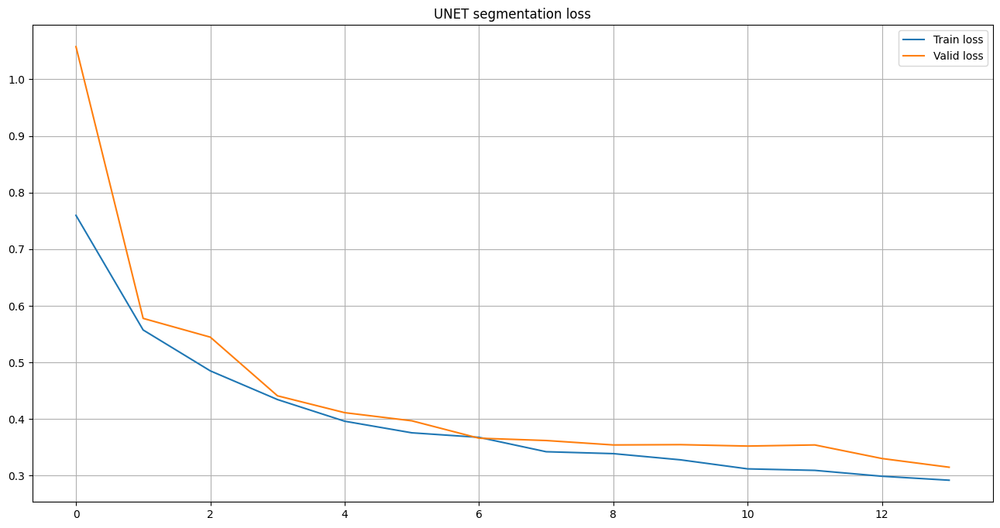

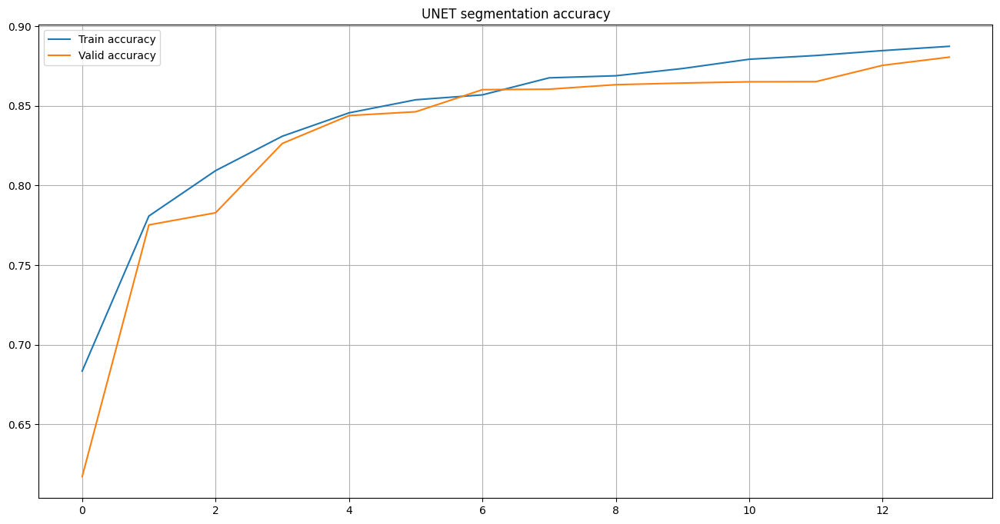

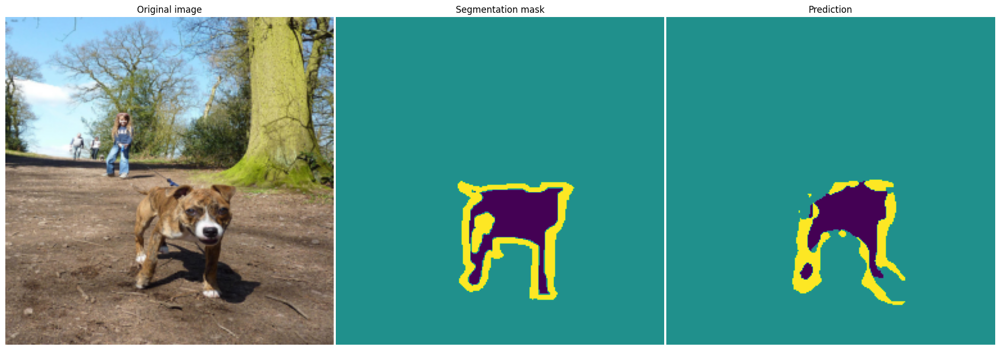

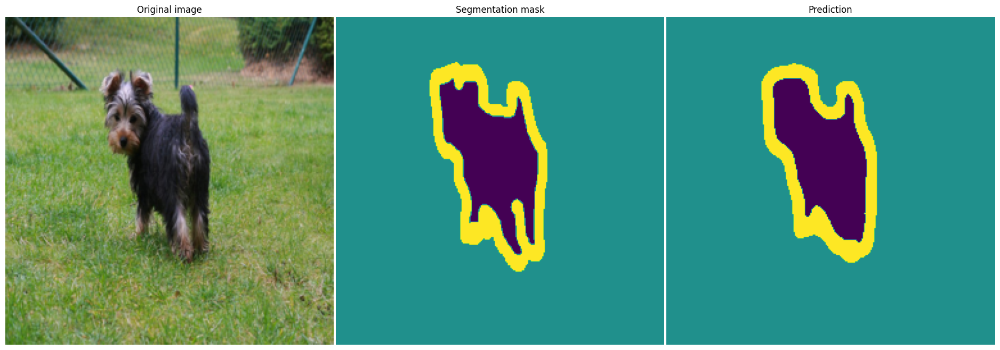

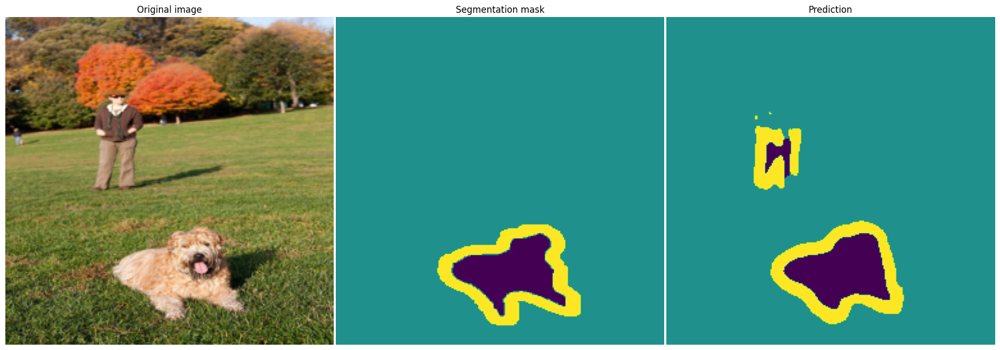

...

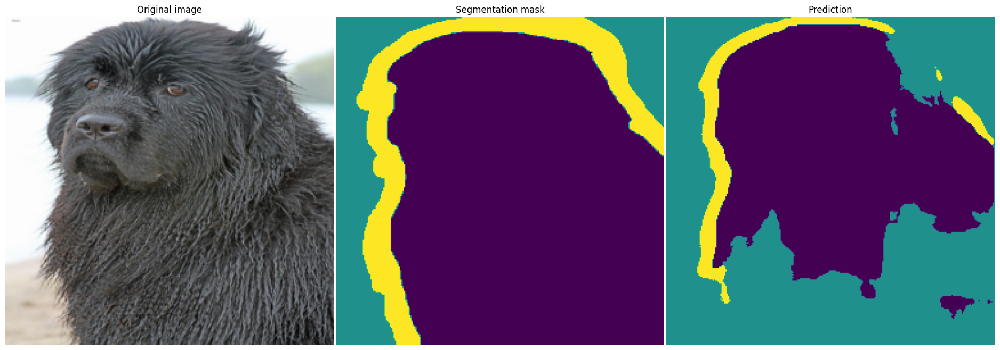

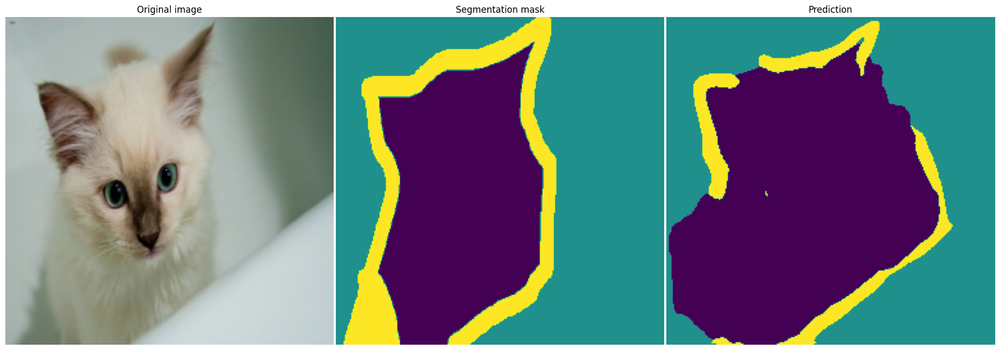

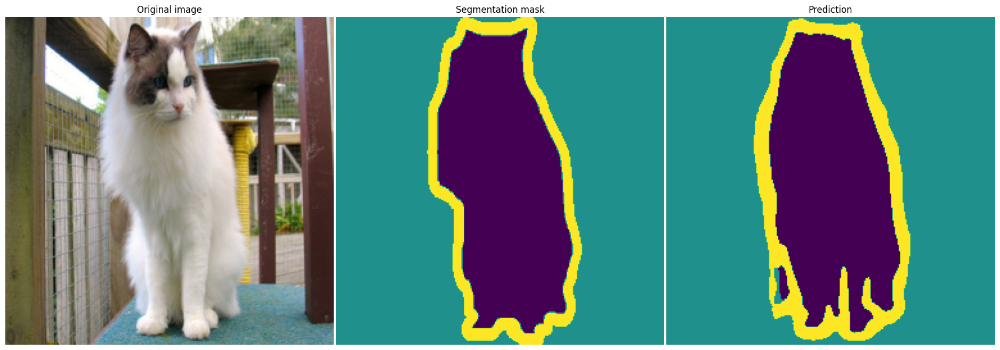

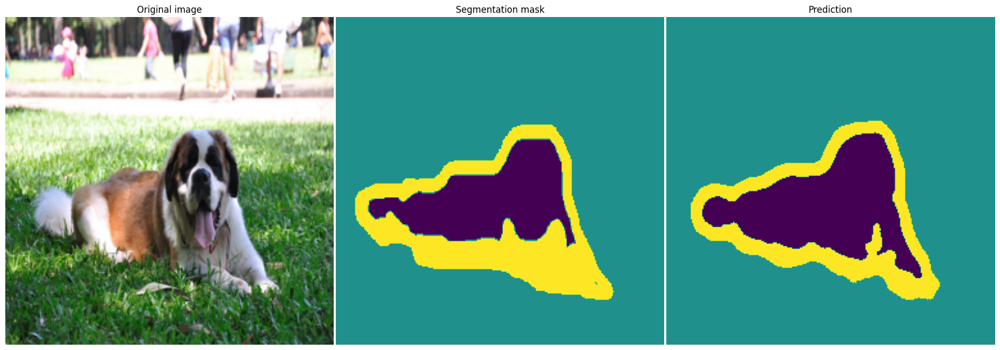

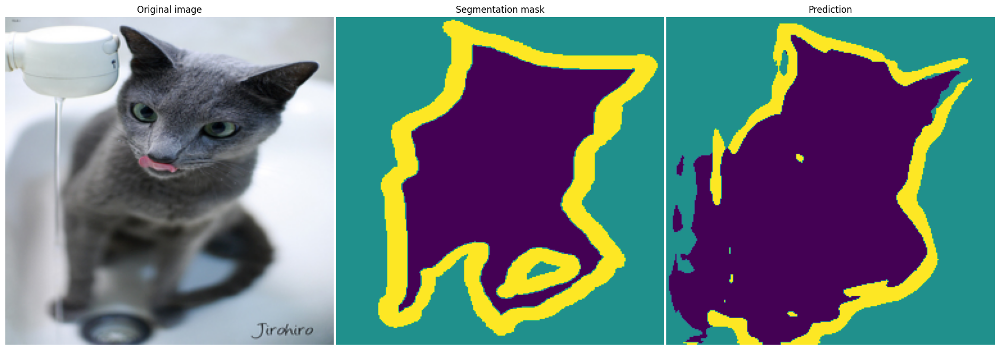

In [39]:
whole_train_valid_cycle(model, 20, 'UNET segmentation', '/kaggle/working/output')

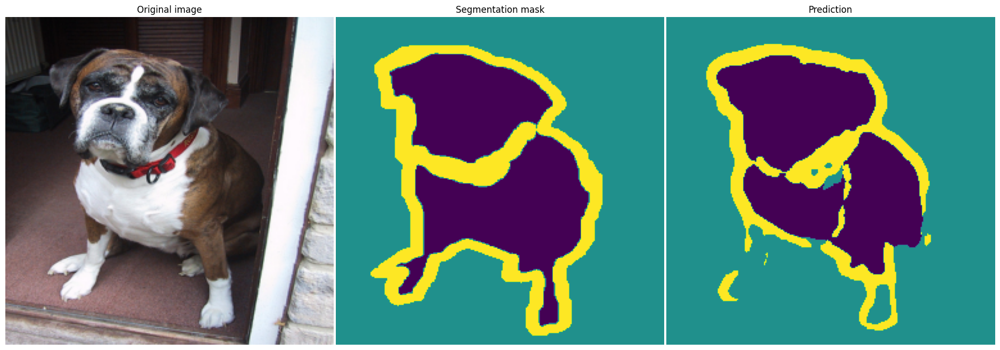

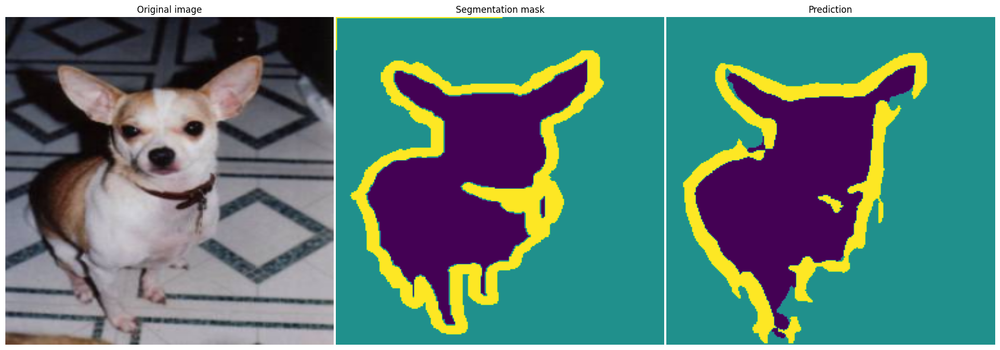

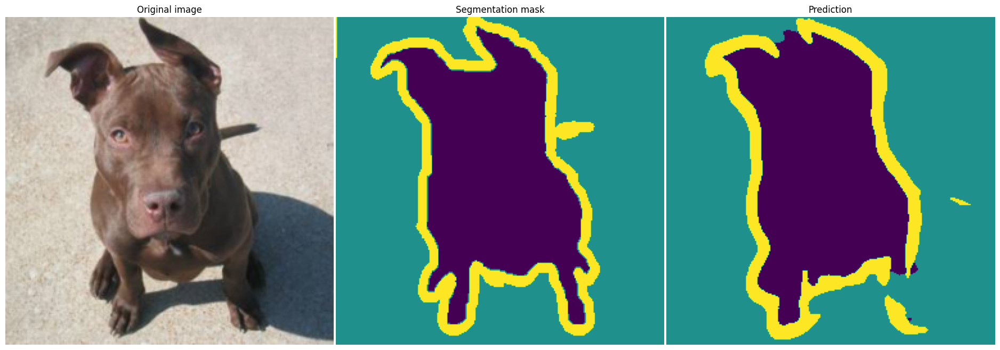

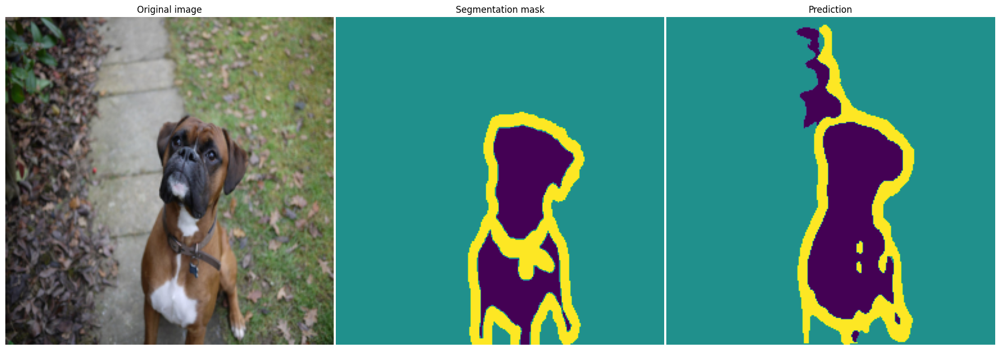

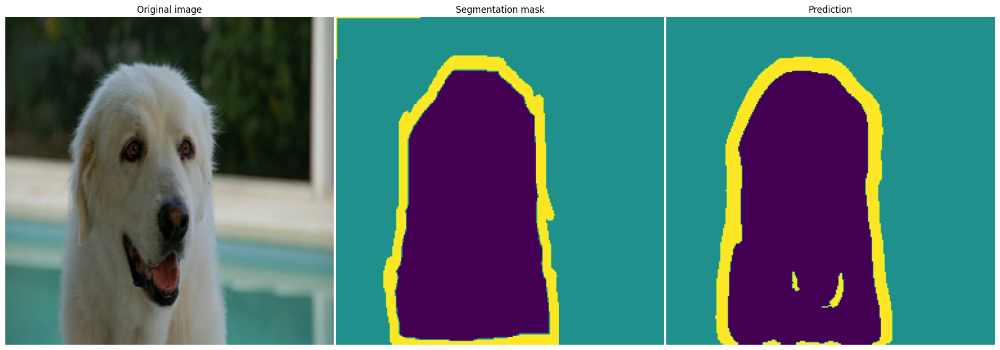

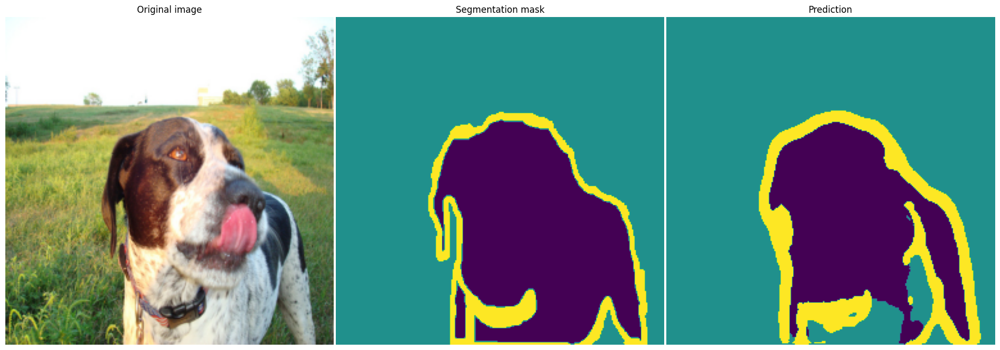

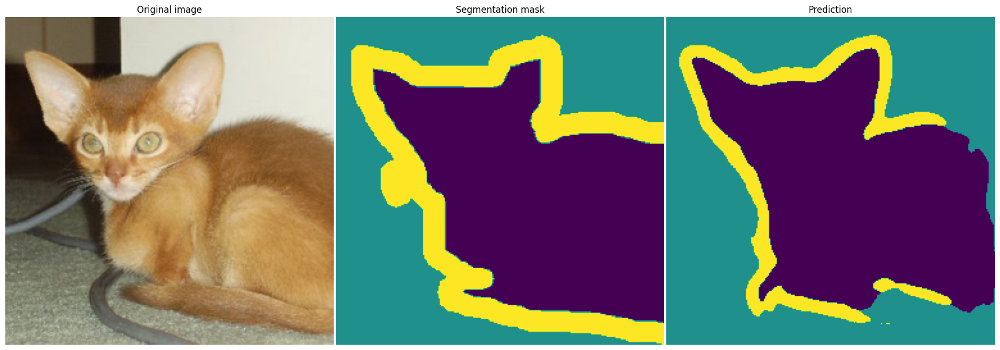

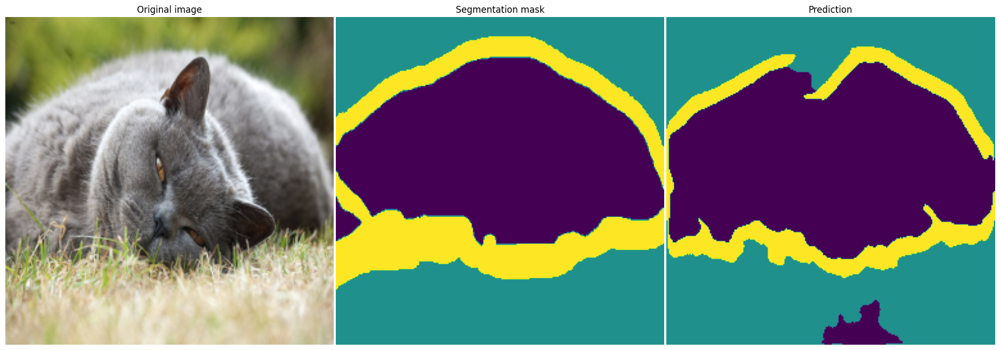

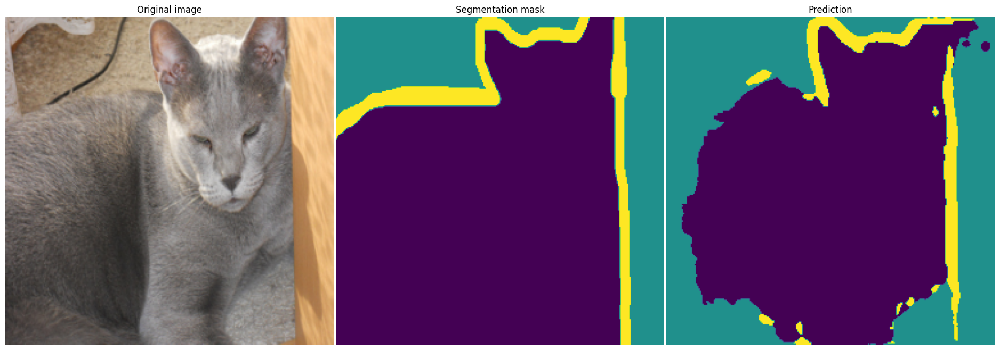

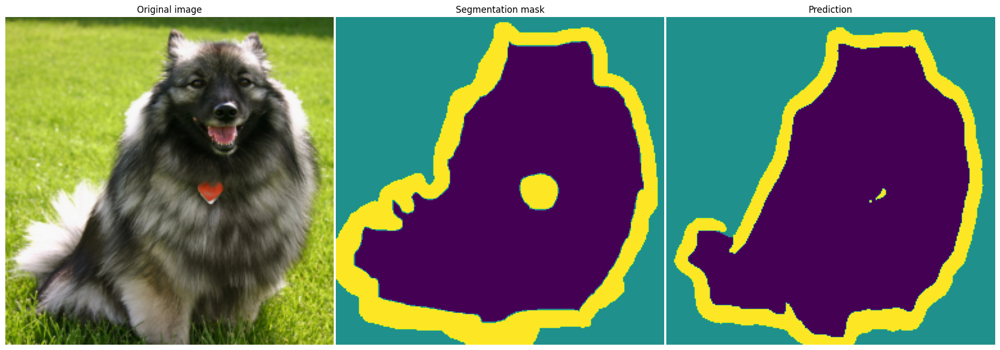

In [40]:
visualize(model, next(iter(train_loader)))